In [2]:
import json
from PIL import Image
import pandas as pd
from torch.utils.data import Dataset, DataLoader
import torch
import torchvision
import torchvision.transforms as transforms
import glob

In [3]:
datapath = "../../../mnt/nfs_mount/single_frames/035999/"

In [4]:
image_path = "../../../mnt/nfs_mount/single_frames/035999/camera_front_blur/035999_india_2020-07-18T11:43:09.886579Z.jpg"

In [5]:
from SimSiam.optimizers import get_optimizer, LR_Scheduler
from SimSiam.simsiam.fastsiam import *
from SimSiam.simsiam.datapreparation_fastsiam import *


In [5]:
train_loader = prepare_data(dataset_size=5000, batch_size=32, num_views=4)

In [6]:

class ZenseactDataset(Dataset):
    def __init__(self, size=50_000, transform=None):
        self.image_paths = []
        self.transform = transform

        # The parent directory containing the folders
        parent_directory = "../../../mnt/nfs_mount/single_frames"

        # Find all folders with a 6-digit name
        folder_pattern = os.path.join(parent_directory, "[0-9]" * 6)

        # Get the list of matching folders
        folders = glob.glob(folder_pattern)
        self.folders = folders[:size] # first 5000 folders

        for folder in self.folders:
            id = os.path.basename(folder) # id = foldername
            # load image
            image_path = f"../../../mnt/nfs_mount/single_frames/{id}/camera_front_blur/"
            image_path = glob.glob(image_path + "*.jpg")
            self.image_paths.append(image_path)


    def __len__(self):
        return len(self.folders)


    def __getitem__(self, idx):
        image_path = self.image_paths[idx][0]
        # load image
        image = Image.open(image_path).convert('RGB')
        # resize image
        downsampled_image = image.resize((224, 224))

        if self.transform:
            downsampled_image = self.transform(downsampled_image)

        dummy_label = 0        
        return downsampled_image, dummy_label
    

class TwoCropsTransform:
    """Take two random crops of one image as the query and key."""

    def __init__(self, base_transform, num_views):
        self.base_transform = base_transform
        self.num_views = num_views

    def __call__(self, x):
        q = [self.base_transform(x)]
        views = []
        for view in range(self.num_views):
            view = self.base_transform(x)
            views.append(view)
        #q = q.extend(views)
        return [q, views]


# TODO Normalize
#normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
#                                    std=[0.229, 0.224, 0.225])

# MoCo v2's aug: similar to SimCLR https://arxiv.org/abs/2002.05709
augmentation = [
    transforms.RandomResizedCrop(224, scale=(0.2, 1.)),
    transforms.RandomApply([
        transforms.ColorJitter(0.4, 0.4, 0.4, 0.1)  # not strengthened
    ], p=0.8),
    transforms.RandomGrayscale(p=0.2),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    #normalize
]
#train_set, val_set = torch.utils.data.random_split(trainset, [45000, 5000])
trainset = ZenseactDataset(1000, transform=TwoCropsTransform(transforms.Compose(augmentation), 4))

In [8]:
trainloader = torch.utils.data.DataLoader(trainset, batch_size=32, shuffle=True, num_workers=4)

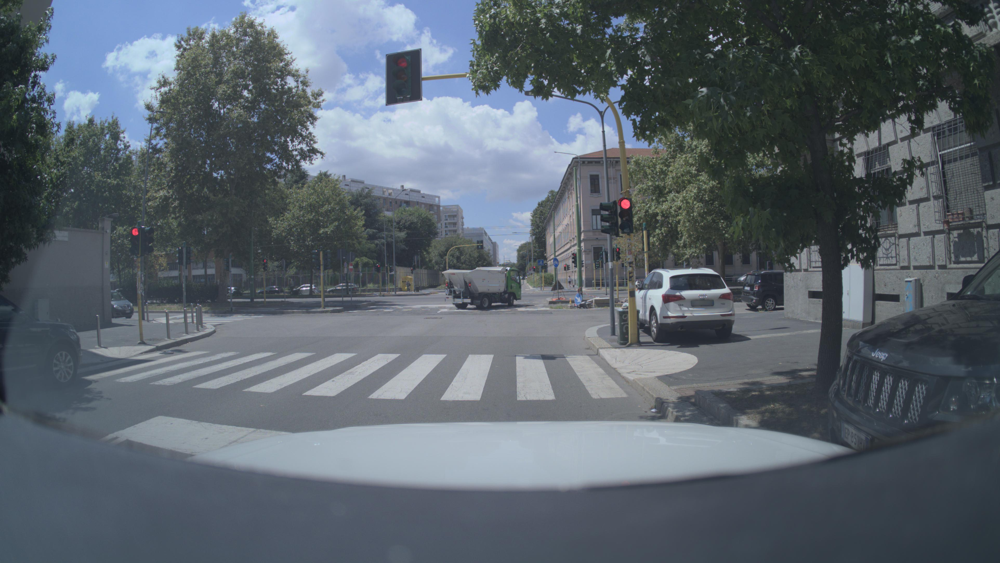

In [9]:
image = Image.open(image_path)
image.show()

/tmp/ipykernel_44335/3064904058.py:1: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  downsampled_image = image.resize((224, 224), Image.ANTIALIAS)


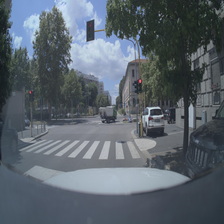

In [10]:
downsampled_image = image.resize((224, 224), Image.ANTIALIAS)
downsampled_image.show()

In [11]:
def visualize_img(id):
    image_path = f"../../../mnt/nfs_mount/single_frames/{id}/camera_front_blur/"
    image_files = glob.glob(image_path + "*.jpg")
    if len(image_files) > 0:
        image = Image.open(image_files[0])
        # image.show()
    return image

In [14]:
img = visualize_img("035999")


In [8]:
img.size


(3848, 2168)

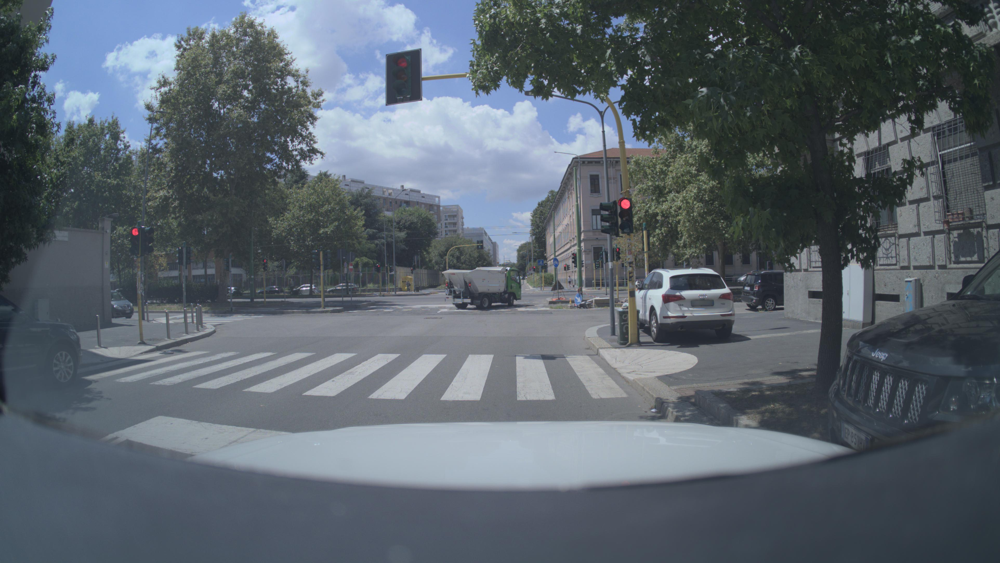

In [9]:
visualize_img("035999")

In [6]:
def get_image_data(id):
    """takes image folder id, returns the image and the bounding boxes"""
    image_path = f"../../../mnt/nfs_mount/single_frames/{id}/camera_front_blur/"
    image_file = glob.glob(image_path + "*.jpg")
    if len(image_file) > 0:
        image = Image.open(image_file[0])
        # downsample image
        downsampled_image = image.resize((300, 200), Image.ANTIALIAS)
        
    # get bounding boxes

In [7]:
def get_annotations(id):
    annotation_path = f"../../../mnt/nfs_mount/single_frames/{id}/annotations/object_detection/"
    annotation_file = glob.glob(annotation_path + "*.json")
    f = open(annotation_file[0])
    annotation_list = json.load(f)

    column_names = ['image_id', 'x_min', 'y_min', 'x_max', 'y_max']
    df = pd.DataFrame(columns=column_names)

    # load image to get shape
    image_path = f"../../../mnt/nfs_mount/single_frames/{id}/camera_front_blur/"
    image_files = glob.glob(image_path + "*.jpg")
    if len(image_files) > 0:
        image = Image.open(image_files[0])
    size = image.size

    # only get cars
    for annotation in annotation_list:
        if annotation["properties"]["class"] == "Vehicle":
            # get bounding boxes
            box_coordinates = annotation["geometry"]["coordinates"]

            # Rescale bounding boxes 
            new_size = (224, 224)
            scale_x = new_size[0] / size[0]
            scale_y = new_size[1] / size[1]
            
            min_x = min(coord[0] for coord in box_coordinates) * scale_x
            min_y = min(coord[1] for coord in box_coordinates) * scale_y
            max_x = max(coord[0] for coord in box_coordinates) * scale_x
            max_y = max(coord[1] for coord in box_coordinates) * scale_y

            new_row = {"image_id": id, "x_min": min_x, "y_min": min_y, "x_max": max_x, "y_max": max_y}
            df = pd.concat([df, pd.DataFrame([new_row])], ignore_index=True)

    return df

In [8]:
def create_df_bounding_boxes():
    # The parent directory containing the folders
    parent_directory = "../../../mnt/nfs_mount/single_frames"

    # Find all folders with a 6-digit name
    folder_pattern = os.path.join(parent_directory, "[0-9]" * 6)

    # Get the list of matching folders
    folders = glob.glob(folder_pattern)
    folders = folders[:5000] # first 5000 folders

    column_names = ['image_id', 'x_min', 'y_min', 'x_max', 'y_max']
    total_df = pd.DataFrame(columns=column_names)

    # iterate through all folders (009999 etc.)
    for folder in folders:
        id = os.path.basename(folder) # id = foldername
        df = get_annotations(id)
        total_df = pd.concat([total_df, df], ignore_index=True)
    return total_df

In [9]:
df = create_df_bounding_boxes()
df.to_csv('df_bounding_boxes.csv')

In [12]:
df = pd.read_csv("df_bounding_boxes.csv") #,dtype = str)
df

,Unnamed: 0,image_id,x_min,y_min,x_max,y_max
0,0,0,106.705031,114.028192,109.978295,118.466863
1,1,0,91.954096,114.101550,94.489813,117.093727
2,2,0,54.873015,117.279705,58.181788,120.765756
3,3,0,127.107193,109.194834,149.284241,135.942583
4,4,0,102.623784,112.401919,108.190021,120.771956
...,...,...,...,...,...,...
123519,123519,5123,102.893856,105.685776,104.174045,107.488407
123520,123520,5123,102.313505,105.731225,103.337652,107.276329
123521,123521,5123,101.647804,106.079624,102.518327,107.321772
123522,123522,5123,100.828486,106.261407,101.771956,107.488407


In [15]:
sub_df = df[df["image_id"] == 0]
sub_df

,Unnamed: 0,image_id,x_min,y_min,x_max,y_max
0,0,0,106.705031,114.028192,109.978295,118.466863
1,1,0,91.954096,114.101550,94.489813,117.093727
2,2,0,54.873015,117.279705,58.181788,120.765756
3,3,0,127.107193,109.194834,149.284241,135.942583
4,4,0,102.623784,112.401919,108.190021,120.771956
5,5,0,64.829605,116.709373,69.916757,120.304945
6,6,0,85.341206,114.158376,88.113846,118.140369
7,7,0,109.063784,113.904207,110.785696,116.523395
8,8,0,107.220790,112.801771,108.184782,114.321624
9,9,0,109.594678,113.830849,111.277006,116.318819


In [10]:
class ZenseactLabeledDataset(torch.utils.data.Dataset):
    def __init__(self, data):
        self.df = pd.read_csv("df_bounding_boxes.csv")
        # image tensor

        # box coordinates

        # label (1)

        # id


        self.data = data
        self.n_samples = len(data)

    def __getitem__(self, index):
        data = self.df.iloc[index]

        id = data['image_id']
        # TODO: could be several rows
        x_min, y_min, x_max, y_max = data['x_min'], data['y_min'], data['x_max'], data['y_max']

        img = self.data[index]["image_id"]
        boxes = self.data[index]["boxes"]
        labels = self.data[index]["labels"]
        id = self.data[index]["image_id"]
        target = {}
        target['boxes'] = [x_min, y_min, x_max, y_max]
        target['labels'] = labels
        return img, target, id
    
    def __len__(self):
        return self.n_samples

In [ ]:
df

In [14]:
class ZenseactDataset(Dataset):
    def __init__(self, size=50_000, transform=None):
        self.image_paths = []
        self.transform = transform

        # The parent directory containing the folders
        parent_directory = "../../../mnt/nfs_mount/single_frames"

        # Find all folders with a 6-digit name
        folder_pattern = os.path.join(parent_directory, "[0-9]" * 6)

        # Get the list of matching folders
        folders = glob.glob(folder_pattern)
        self.folders = folders[:size] # first 5000 folders

        for folder in self.folders:
            id = os.path.basename(folder) # id = foldername
            # load image
            image_path = f"../../../mnt/nfs_mount/single_frames/{id}/camera_front_blur/"
            image_path = glob.glob(image_path + "*.jpg")
            self.image_paths.append(image_path)


    def __len__(self):
        return len(self.folders)


    def __getitem__(self, idx):
        image_path = self.image_paths[idx][0]
        # load image
        image = Image.open(image_path).convert('RGB')
        # resize image
        downsampled_image = image.resize((224, 224))

        if self.transform:
            downsampled_image = self.transform(downsampled_image)

        dummy_label = 0        
        return downsampled_image, dummy_label

In [15]:
dataset = ZenseactDataset(100)
image = dataset[1]
image

(<PIL.Image.Image image mode=RGB size=224x224>, 0)

In [19]:
class TwoCropsTransform:
    """Take two random crops of one image as the query and key."""

    def __init__(self, base_transform):
        self.base_transform = base_transform

    def __call__(self, x):
        q = self.base_transform(x)
        k = self.base_transform(x)
        return [q, k]


def prepare_data(batch_size=64):
    # TODO
    #normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
    #                                    std=[0.229, 0.224, 0.225])

    # MoCo v2's aug: similar to SimCLR https://arxiv.org/abs/2002.05709
    augmentation = [
        transforms.RandomResizedCrop(224, scale=(0.2, 1.)),
        transforms.RandomApply([
            transforms.ColorJitter(0.4, 0.4, 0.4, 0.1)  # not strengthened
        ], p=0.8),
        transforms.RandomGrayscale(p=0.2),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        #normalize
    ]
    #train_set, val_set = torch.utils.data.random_split(trainset, [45000, 5000])
    trainset = ZenseactDataset(5_000, transform=TwoCropsTransform(transforms.Compose(augmentation)))

    trainloader = torch.utils.data.DataLoader(trainset, batch_size=batch_size, shuffle=True, num_workers=4)

    return trainloader

In [20]:
dataloader = prepare_data()

for idx, data in enumerate(dataloader):
    print(data)

[[tensor([[[[0.3647, 0.3725, 0.4471,  ..., 0.5490, 0.5412, 0.5412],
          [0.3569, 0.3725, 0.4314,  ..., 0.5490, 0.5412, 0.5412],
          [0.3490, 0.3529, 0.4078,  ..., 0.5569, 0.5490, 0.5412],
          ...,
          [0.2588, 0.2588, 0.2588,  ..., 0.1608, 0.1490, 0.1490],
          [0.2627, 0.2627, 0.2588,  ..., 0.1647, 0.1608, 0.1608],
          [0.2706, 0.2627, 0.2588,  ..., 0.1647, 0.1608, 0.1608]],

         [[0.3686, 0.3961, 0.4863,  ..., 0.5490, 0.5373, 0.5373],
          [0.3569, 0.3922, 0.4706,  ..., 0.5490, 0.5373, 0.5373],
          [0.3529, 0.3725, 0.4471,  ..., 0.5569, 0.5490, 0.5373],
          ...,
          [0.3098, 0.3098, 0.3098,  ..., 0.1804, 0.1765, 0.1765],
          [0.3137, 0.3137, 0.3098,  ..., 0.1843, 0.1804, 0.1804],
          [0.3176, 0.3137, 0.3098,  ..., 0.1843, 0.1804, 0.1804]],

         [[0.3451, 0.3765, 0.4588,  ..., 0.5098, 0.5059, 0.5059],
          [0.3333, 0.3686, 0.4471,  ..., 0.5098, 0.5059, 0.5059],
          [0.3294, 0.3490, 0.4118,  ...,

KeyboardInterrupt: 

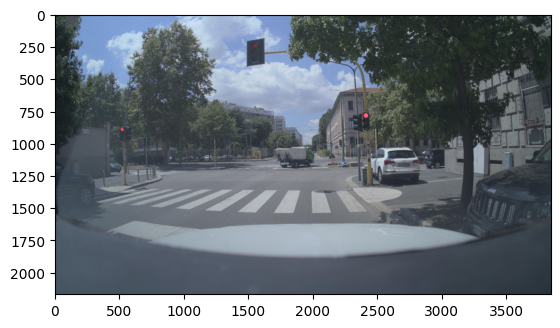

In [52]:
import cv2
import matplotlib.pyplot as plt

im = cv2.imread(image_path)
#im_resized = cv2.resize(im, (224, 224), interpolation=cv2.INTER_LINEAR)

plt.imshow(cv2.cvtColor(im, cv2.COLOR_BGR2RGB))
plt.show()

In [35]:
annotation_file = "../../../mnt/nfs_mount/single_frames/035999/annotations/object_detection/035999_india_2020-07-18T11:43:09.886579Z.json"

In [36]:
f = open(annotation_file)
annotation_json = json.load(f)

In [37]:
annotation_json

[{'geometry': {'type': 'MultiPoint',
   'coordinates': [[523.832763671875, 870.0216064453125],
    [547.19287109375, 878.4312133789062],
    [516.3575439453125, 988.6908569335938],
    [493.4646911621094, 970.9371948242188]]},
  'properties': {'annotation_uuid': '0d6690fa-e3ad-4904-b2b1-1e6088bd3606',
   'class': 'TrafficSignal',
   'unclear': False,
   'is_for_ego_road': 'True',
   'is_for_ego_lane': 'False',
   'is_for_other_traffic_participant': 'False',
   'is_on_dynamic_object': False,
   'occlusion_ratio': 'None',
   'traffic_content_visible': 'True',
   'is_for_construction': False,
   'orientation_3d_qw': 0.8630120348155061,
   'orientation_3d_qx': 0,
   'orientation_3d_qy': 0,
   'orientation_3d_qz': -0.5051833605371415,
   'size_3d_length': 0.267,
   'size_3d_width': 0.297,
   'size_3d_height': 0.762,
   'location_3d': {'type': 'Point', 'coordinates': [-10.368, 10.333, 0.81]}}},
 {'geometry': {'type': 'MultiPoint',
   'coordinates': [[2388.683349609375, 469.8637390136719],
  

In [38]:
annotation_json[10]

{'geometry': {'type': 'MultiPoint',
  'coordinates': [[1602.4527587890625, 982.7818603515625],
   [1589.0125732421875, 994.9620361328125],
   [1600.352783203125, 1007.1422119140625],
   [1611.69287109375, 992.8619995117188]]},
 'properties': {'annotation_uuid': 'dc23901c-485d-4b34-bcce-1dbb18e997bd',
  'class': 'TrafficSign',
  'unclear': False,
  'is_for_ego_road': 'True',
  'is_for_ego_lane': 'False',
  'is_for_other_traffic_participant': 'False',
  'is_complementary_to_signs': [],
  'is_on_dynamic_object': False,
  'occlusion_ratio': 'Light',
  'traffic_content_visible': 'False',
  'is_for_construction': False}}

In [39]:
len(annotation_json)

137

In [43]:
annotation_json[0]["properties"]["class"]

'TrafficSignal'

In [40]:
box_coordinates = annotation_json[0]["geometry"]["coordinates"]
box_coordinates

[[523.832763671875, 870.0216064453125],
 [547.19287109375, 878.4312133789062],
 [516.3575439453125, 988.6908569335938],
 [493.4646911621094, 970.9371948242188]]

In [56]:
box_coordinates = [[1183.486083984375, 1094.242431640625],
    [1231.6953125, 1129.4676513671875],
    [1205.5777587890625, 1140.3499755859375],
    [1117.8974609375, 1129.15673828125]] # car

In [57]:
min_x = min(coord[0] for coord in box_coordinates)
min_y = min(coord[1] for coord in box_coordinates)
max_x = max(coord[0] for coord in box_coordinates)
max_y = max(coord[1] for coord in box_coordinates)

bounding_box = {"x_min": min_x, "y_min": min_y, "x_max": max_x, "y_max": max_y}

print(bounding_box)

{'x_min': 1117.8974609375, 'y_min': 1094.242431640625, 'x_max': 1231.6953125, 'y_max': 1140.3499755859375}


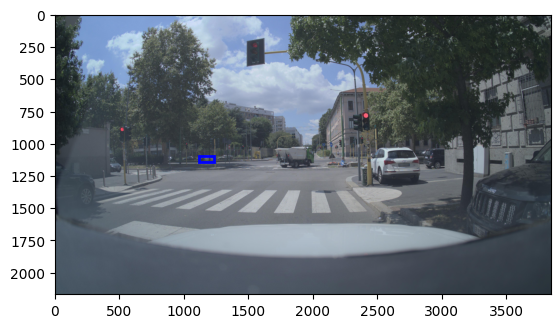

In [58]:
from matplotlib.patches import Rectangle

plt.imshow(cv2.cvtColor(im, cv2.COLOR_BGR2RGB))

width = max_x - min_x
height = max_y - min_y

plt.gca().add_patch(Rectangle((min_x, min_y), width, height, edgecolor='b', facecolor='none', linewidth=2))
plt.show()
